In [1]:
import h5py
import numpy as np
import pandas as pd
import os
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as pl
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score
import plotly.express as px
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [2]:
file_path1 = '/Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/LUAD/TCGA-34-2605-01Z-00-DX1.h5'
file_path2 = '/Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/LUSC/TCGA-60-2695-01Z-00-DX1.h5'

In [3]:
output_dir = '/Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/CSV'

In [4]:
def convert_h5_to_csv(file_path1, file_path2, output_dir, dataset_name='features', ):
    """
    Convert two HDF5 files containing a dataset (default name 'features')
    into CSV files and save them in the specified output directory.
    
    Parameters:
      file_path1 (str): Path to the first HDF5 file.
      file_path2 (str): Path to the second HDF5 file.
      dataset_name (str): Name of the dataset inside the HDF5 file to convert.
      output_dir (str): Directory where the CSV files will be saved.
      
    Returns:
      list: List of output CSV file paths.
    """
    file_paths = [file_path1, file_path2]
    output_files = []
    
    for file_path in file_paths:
        # Open the HDF5 file and load the dataset
        with h5py.File(file_path, 'r') as f:
            data = f[dataset_name][()]
        
        # Convert the data into a DataFrame
        df = pd.DataFrame(data)
        
        # Create a CSV file name based on the HDF5 file name
        base_name = os.path.basename(file_path)
        name, _ = os.path.splitext(base_name)
        output_file = os.path.join(output_dir, name + '.csv')
        
        # Save the DataFrame to CSV
        df.to_csv(output_file, index=False)
        output_files.append(output_file)
        
        print(f"Converted {file_path} to {output_file}")
    
    return output_files

csv_files = convert_h5_to_csv(file_path1, file_path2, output_dir)

Converted /Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/LUAD/TCGA-34-2605-01Z-00-DX1.h5 to /Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/CSV/TCGA-34-2605-01Z-00-DX1.csv
Converted /Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/LUSC/TCGA-60-2695-01Z-00-DX1.h5 to /Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/CSV/TCGA-60-2695-01Z-00-DX1.csv


In [5]:
# Specify the paths to your CSV files
csv_file1 = '/Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/CSV/TCGA-34-2605-01Z-00-DX1.csv'
csv_file2 = '/Users/franciscodowney/Desktop/UCLA/Courses/Winter Quarter 2025/228/Project/Sample Data/CSV/TCGA-60-2695-01Z-00-DX1.csv'

# Read each CSV file into a DataFrame
df1 = pd.read_csv(csv_file1)
df2 = pd.read_csv(csv_file2)

# Print out basic information to verify
print("First DataFrame shape:", df1.shape)
df1.head()


First DataFrame shape: (11118, 1024)


,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,1.474315,-0.666727,-1.974797,-1.256150,0.515979,-1.335311,2.114447,0.424679,-1.213329,-1.245090,...,0.427488,0.582937,0.660590,0.927977,-1.937045,0.066657,-0.419031,-0.326808,2.287257,0.642519
1,0.494876,-0.999607,-1.453786,-1.227275,1.245971,-0.308227,3.008136,1.273515,-2.082061,-1.435105,...,-0.226865,-1.808129,-1.667762,-0.795457,-2.096837,0.946700,-0.187979,-0.708843,0.656675,0.965120
2,-1.082653,0.162037,-2.321477,-1.747641,1.103947,-0.063123,1.752678,0.955678,-2.262392,-0.569231,...,0.947895,-0.793665,-0.270598,-0.530223,-0.971143,0.705310,0.377004,0.045125,-0.062466,0.340421
3,-2.598149,-1.053627,-1.366377,-0.667204,1.758170,0.091624,1.062655,2.573047,-1.123383,0.320563,...,2.655897,-0.547185,2.287387,-1.715301,-1.642288,-0.086223,0.322645,0.655691,-0.872182,-1.649467
4,-0.732723,-1.219871,-2.536912,-1.135134,1.109412,0.439950,-1.936660,1.229334,-2.396855,-0.263832,...,0.816054,0.243828,-0.702982,-1.330800,-0.328098,0.132637,-0.256539,1.112674,-0.048962,-0.563251


In [6]:
print("Second DataFrame shape:", df2.shape)
df2.head()

Second DataFrame shape: (21190, 1024)


,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,-1.804425,-0.610569,-0.391675,1.260657,-0.335761,-0.163783,-0.886402,1.731663,0.087831,1.054178,...,-1.480157,-0.999905,-1.500431,1.061642,-0.923976,-0.670813,0.531844,0.725331,-0.281149,2.159346
1,-1.328585,0.077204,-2.606249,1.156600,1.464971,0.022366,0.770011,-2.529753,-0.088409,-1.465911,...,0.945053,-0.191431,1.049877,-0.827817,-1.840868,-0.867016,0.009369,-0.593576,-1.347104,1.983530
2,0.205326,-2.613375,-3.144863,1.426606,0.646696,0.265990,0.468540,-0.190974,-1.214034,-1.682211,...,0.078405,0.112883,-0.257875,-0.396067,-1.615234,-0.354981,-0.328273,-0.653041,-0.456634,1.721949
3,0.374768,-3.494678,-1.612532,0.966990,0.136338,1.127031,0.736086,1.887885,-1.352275,-1.094126,...,-0.198908,0.449060,-1.350177,-0.490420,0.233689,-0.612056,-0.741666,0.671085,0.261749,1.091268
4,-0.765728,0.773689,0.167281,1.544422,1.808335,0.566355,-0.330339,0.709516,-1.000138,-0.338299,...,1.036710,1.298351,-0.278654,0.564715,-0.198329,-0.583449,-0.062815,-1.161371,-1.734559,2.515830


In [7]:
# Add a labels column to each DataFrame
df1['label'] = 0  # All rows in df1 get label 0 (LUAD)
df2['label'] = 1 # All rows in df2 get label 1 (LUSC)

df1.head()
df2.head()

,0,1,2,3,4,5,6,7,8,9,...,1015,1016,1017,1018,1019,1020,1021,1022,1023,label
0,-1.804425,-0.610569,-0.391675,1.260657,-0.335761,-0.163783,-0.886402,1.731663,0.087831,1.054178,...,-0.999905,-1.500431,1.061642,-0.923976,-0.670813,0.531844,0.725331,-0.281149,2.159346,1
1,-1.328585,0.077204,-2.606249,1.156600,1.464971,0.022366,0.770011,-2.529753,-0.088409,-1.465911,...,-0.191431,1.049877,-0.827817,-1.840868,-0.867016,0.009369,-0.593576,-1.347104,1.983530,1
2,0.205326,-2.613375,-3.144863,1.426606,0.646696,0.265990,0.468540,-0.190974,-1.214034,-1.682211,...,0.112883,-0.257875,-0.396067,-1.615234,-0.354981,-0.328273,-0.653041,-0.456634,1.721949,1
3,0.374768,-3.494678,-1.612532,0.966990,0.136338,1.127031,0.736086,1.887885,-1.352275,-1.094126,...,0.449060,-1.350177,-0.490420,0.233689,-0.612056,-0.741666,0.671085,0.261749,1.091268,1
4,-0.765728,0.773689,0.167281,1.544422,1.808335,0.566355,-0.330339,0.709516,-1.000138,-0.338299,...,1.298351,-0.278654,0.564715,-0.198329,-0.583449,-0.062815,-1.161371,-1.734559,2.515830,1


In [8]:
combined_df = pd.concat([df1, df2], ignore_index=True)
combined_df.head()
combined_df.shape

(32308, 1025)

In [9]:
# Features (everything except 'labels')
X = combined_df.drop('label', axis=1)

# Labels (just the 'labels' column)
y = combined_df['label']


In [10]:
X

,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,1.474315,-0.666727,-1.974797,-1.256150,0.515979,-1.335311,2.114447,0.424679,-1.213329,-1.245090,...,0.427488,0.582937,0.660590,0.927977,-1.937045,0.066657,-0.419031,-0.326808,2.287257,0.642519
1,0.494876,-0.999607,-1.453786,-1.227275,1.245971,-0.308227,3.008136,1.273515,-2.082061,-1.435105,...,-0.226865,-1.808129,-1.667762,-0.795457,-2.096837,0.946700,-0.187979,-0.708843,0.656675,0.965120
2,-1.082653,0.162037,-2.321477,-1.747641,1.103947,-0.063123,1.752678,0.955678,-2.262392,-0.569231,...,0.947895,-0.793665,-0.270598,-0.530223,-0.971143,0.705310,0.377004,0.045125,-0.062466,0.340421
3,-2.598149,-1.053627,-1.366377,-0.667204,1.758170,0.091624,1.062655,2.573047,-1.123383,0.320563,...,2.655897,-0.547185,2.287387,-1.715301,-1.642288,-0.086223,0.322645,0.655691,-0.872182,-1.649467
4,-0.732723,-1.219871,-2.536912,-1.135134,1.109412,0.439950,-1.936660,1.229334,-2.396855,-0.263832,...,0.816054,0.243828,-0.702982,-1.330800,-0.328098,0.132637,-0.256539,1.112674,-0.048962,-0.563251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32303,1.825140,-0.122197,0.357139,0.188137,-0.443434,0.376117,-0.238599,-0.194096,-3.131127,-0.002992,...,-0.872744,1.128786,-2.427280,0.656691,-0.722264,0.766178,-0.256976,1.037582,-0.250241,0.219107
32304,0.897308,0.131026,0.671326,-1.010275,-1.221514,0.672431,-0.528466,0.643906,-3.535082,0.938590,...,-1.397181,0.051359,-2.153342,1.521605,-0.332530,0.516102,-0.310538,1.132611,-1.034094,0.111820
32305,0.542192,0.934045,0.811752,-1.007612,-0.653492,0.625753,-0.882706,0.222602,-3.506110,0.991305,...,-2.361324,0.839059,-2.103205,1.659785,0.328203,0.799640,-0.544861,1.506765,-1.063656,0.204687
32306,1.353299,0.676807,1.459349,0.064383,-1.753225,0.577836,-0.370243,-0.396400,-2.485459,-0.027723,...,-0.240184,-0.542808,-1.393372,1.807507,-1.028509,-0.602152,-0.278704,0.143695,0.562288,0.047216


In [11]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2
)


In [12]:
# Create the MLP model
mlp = MLPClassifier(
    hidden_layer_sizes=(100, 50),
    max_iter=300
)

mlp.fit(X_train, y_train)


MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=300)

In [13]:
accuracy = mlp.score(X_test, y_test)
print(f"Test Accuracy: {accuracy:.2f}")


Test Accuracy: 1.00


In [14]:
y_pred = mlp.predict(X_test)

In [15]:
print(combined_df.columns)

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '1015', '1016', '1017', '1018', '1019', '1020', '1021', '1022', '1023',
       'label'],
      dtype='object', length=1025)


In [16]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2248
           1       1.00      1.00      1.00      4214

    accuracy                           1.00      6462
   macro avg       1.00      1.00      1.00      6462
weighted avg       1.00      1.00      1.00      6462



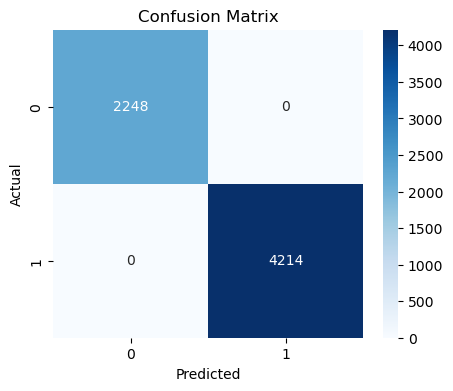

In [17]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0,1], yticklabels=[0,1])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


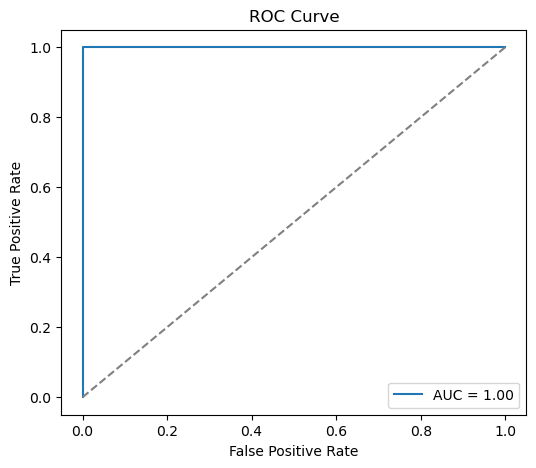

In [18]:
# Get the predicted probabilities for class 1
y_proba = mlp.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f'AUC = {roc_auc_score(y_test, y_proba):.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


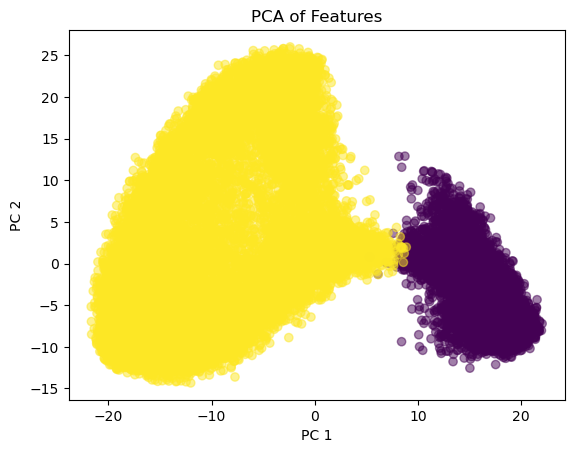

In [19]:
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap='viridis', alpha=0.5)
plt.xlabel("PC 1")
plt.ylabel("PC 2")
plt.title("PCA of Features")
plt.show()


In [20]:
pca = PCA(n_components=3)
X_reduced = pca.fit_transform(X)

# Create interactive 3D scatter plot
fig = px.scatter_3d(
    x=X_reduced[:, 0],
    y=X_reduced[:, 1],
    z=X_reduced[:, 2],
    color=y.astype(str),  # Convert labels to string for better coloring
    labels={'x': 'PC 1', 'y': 'PC 2', 'z': 'PC 3'},
    title='Interactive 3D PCA'
)

fig.show()


In [21]:
!pip install umap-learn


In [22]:
import umap

reducer = umap.UMAP(n_components=3)
X_umap_3d = reducer.fit_transform(X)

# Create interactive 3D scatter plot
fig = px.scatter_3d(
    x=X_umap_3d[:, 0],
    y=X_umap_3d[:, 1],
    z=X_umap_3d[:, 2],
    color=y.astype(str),  # Convert labels to strings for coloring
    title="3D UMAP Projection",
    labels={'x': 'UMAP-1', 'y': 'UMAP-2', 'z': 'UMAP-3'},
)

fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.show()


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
